In [1]:
from collections import defaultdict
from itertools import combinations

# 1. 一个小函数，计算一个 DNA 串的反向互补
def revcomp(seq: str) -> str:
    comp = {'A':'T','T':'A','C':'G','G':'C'}
    return ''.join(comp[c] for c in reversed(seq))

print(revcomp('ATCG'))

# 2. 建两个索引：正向和倒位
def build_bi_strand_index(reference: str, k: int, d: int):
    """
    返回：
      masks,             # LSH 掩码列表
      idx_pos, idx_neg   # 两个 List[Dict]，分别是正向和倒位索引
    """
    masks = list(combinations(range(k), k - d))
    idx_pos = []  # 正向索引
    idx_neg = []  # 倒位索引（对反向互补建表）
    rc_ref = revcomp(reference)
    
    n=len(reference)

    for mask in masks:
        m_pos = defaultdict(list)
        m_neg = defaultdict(list)
        for i in range(n - k + 1):
            kmer_pos = reference[i:i+k]
            key_pos = hash(tuple(kmer_pos[p] for p in mask))
            m_pos[key_pos].append(i)

            kmer_neg=rc_ref[n-(i+k):n-(i)]
            key_neg = hash(tuple(kmer_neg[p] for p in mask))
            m_neg[key_neg].append(i)
            
            
            
        idx_pos.append(m_pos)
        idx_neg.append(m_neg)

    return masks, idx_pos, idx_neg

# 3. 查 query 时，同一个 k-mer 既在正向，也在倒位里查
def match_bi_strand(query: str, k: int, d: int, masks, idx_pos, idx_neg):
    """
    返回 List[(q_pos, r_pos, strand)]
    strand = +1 (正向) 或 -1 (倒位)
    """
    anchors = []
    anchors_r = []
    for q in range(len(query) - k + 1):
        kmer = query[q:q+k]
        # kmer_rc = revcomp(kmer)
        for mask, m_pos, m_neg in zip(masks, idx_pos, idx_neg):
            key = hash(tuple(kmer[p] for p in mask))
            for r in m_pos.get(key, []):
                anchors.append((q, r))
            for r in m_neg.get(key, []):
                anchors_r.append((q, r))
    # 去重
    return list(set(anchors)), list(set(anchors_r))

# —— 使用示例 —— #




CGAT


In [2]:
# ———————— 使用示例 ————————

# 假设：
# reference = "ACTGATCATGATCGTAGCT"  # 长百万级的字符串
# query     = "ACCGAACATGCTCGGAGAT"      # 待比对字符串
def read_sequence_from_file(path: str) -> str:
    """
    从文本文件读取 DNA 序列：
    - 忽略空行和首尾空白
    - 返回纯净的字符串（只包含 A/C/G/T）
    """
    with open(path, "r") as f:
        # 读取每一行，去掉首尾空白，过滤空行
        lines = [line.strip() for line in f if line.strip()]
    # 将多行拼接成一个连续序列
    return "".join(lines)

# 调用示例
reference = read_sequence_from_file("ref2.txt")
query     = read_sequence_from_file("que2.txt")
k, d      = 11, 2

# 1. 建双链索引
masks, idx_pos, idx_neg = build_bi_strand_index(reference, k, d)

# 2. 匹配
anchors ,anchors_r= match_bi_strand(query, k, d, masks, idx_pos, idx_neg)
print("anchors:", anchors[:10])
print("anchors_r:", anchors_r[:10])
# 每个元素是 (q_pos, r_pos, strand)

print("找到的锚点数量len(anchors)：", len(anchors))
print("部分锚点示例：", anchors[:10])
for i, (q_pos, r_pos) in enumerate(anchors[:10], 1):   #索引从1开始计数
    q_kmer = query[q_pos : q_pos + k]
    r_kmer = reference[r_pos : r_pos + k]
    print(f"{i:2d}. query[{q_pos:4d}:{q_pos+k:4d}] = {q_kmer}    "
          f"| reference[{r_pos:4d}:{r_pos+k:4d}] = {r_kmer} ")

print("找到的锚点数量len(anchors)：", len(anchors_r))
print("部分锚点示例：", anchors_r[:10])
for i, (q_pos, r_pos) in enumerate(anchors_r[:10], 1):   #索引从1开始计数
    q_kmer = query[q_pos : q_pos + k]
    r_kmer = reference[r_pos : r_pos + k]
    print(f"{i:2d}. query[{q_pos:4d}:{q_pos+k:4d}] = {q_kmer}    "
          f"| reference[{r_pos:4d}:{r_pos+k:4d}] = {r_kmer} ")


#超参数
if(len(query)<10000):
    max_err2=1000
    min_len3=0
    min_len4=0
    
else:
    max_err2=6
    min_len3=198
    min_len4=1000
    

anchors: [(15438, 5618), (24718, 21524), (19206, 810), (17627, 25340), (23656, 25635), (15724, 22419), (19991, 14326), (12228, 14891), (28855, 28856), (1395, 5488)]
anchors_r: [(5357, 4710), (6225, 26397), (9188, 20630), (27974, 8462), (440, 27216), (6235, 14253), (12176, 25281), (14372, 5823), (6783, 22194), (7629, 23154)]
找到的锚点数量len(anchors)： 263929
部分锚点示例： [(15438, 5618), (24718, 21524), (19206, 810), (17627, 25340), (23656, 25635), (15724, 22419), (19991, 14326), (12228, 14891), (28855, 28856), (1395, 5488)]
 1. query[15438:15449] = GAGTTCAGAGG    | reference[5618:5629] = GAGTTCAGTGC 
 2. query[24718:24729] = AAGAAATAACT    | reference[21524:21535] = AATAAATAAAT 
 3. query[19206:19217] = AAGCCCCTTAT    | reference[ 810: 821] = TAGCGCCTTAT 
 4. query[17627:17638] = AAAACTGGCAC    | reference[25340:25351] = AATACTGGCAA 
 5. query[23656:23667] = GGAAGAAACTG    | reference[25635:25646] = GGCAAAAACTG 
 6. query[15724:15735] = ATAAACAGATA    | reference[22419:22430] = ATAAACCAATA 
 7. qu

anchor q0=15438, r0=5618
anchor q1=6235, r1=14253
TGTGTGTGTCTACTGAATATGGATTGTATT
TGTTCCTTTCCATGTTCAGTGCTTCCTTCA
TGTGTGTGTC  TACTGAATATG  GATTGTATT
TGTTCCTTTC  CATGTTCAGTG  CTTCCTTCA


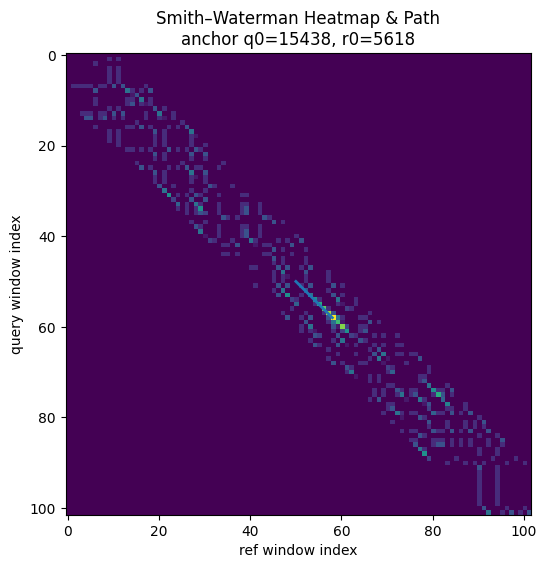

Aligned fragment:
 query[15438:15445] = GAGTTCAG
 ref  [5618:5625] = GAGTTCAG
Best score: 16


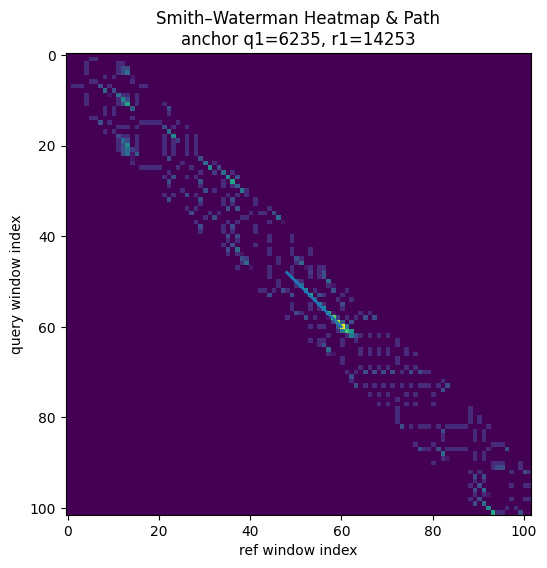

q_st: 6233 q_en: 6244 r_st: 14254 r_en: 14265 r_st_r: 15564 r_en_r: 15575
Aligned fragment:
 query[6233:6244] = TCCATGTTCAGT
 ref  [14254:14265] = ACTGAATATGGA
Best score: 17


In [3]:
import numpy as np 
import matplotlib.pyplot as plt





def compute_banded_sw_matrix(ref, query, r0, q0,
                             W=50, band=10,
                             match=2, mismatch=-5, gap=-10):
    """
    本函数返回：
      H:    (n+1)x(m+1) 的得分矩阵
      path: 回溯路径列表 [(i1,j1),...,(ik,jk)]
      q_lo, r_lo: 窗口在原始序列中的左边界
    """
    # 定义窗口
    q_lo = max(0, q0 - W); q_hi = min(len(query), q0 + W + 1)
    r_lo = max(0, r0 - W); r_hi = min(len(ref),   r0 + W + 1)
    n, m = q_hi - q_lo, r_hi - r_lo

    # 初始化
    H = np.zeros((n+1, m+1), dtype=int)
    best_score, bi, bj = 0, 0, 0

    # 填表
    for i in range(1, n+1):
        j_start = max(1, i - band)
        j_end   = min(m, i + band)
        for j in range(j_start, j_end+1):
            sc = match if query[q_lo+i-1] == ref[r_lo+j-1] else mismatch
            diag = H[i-1, j-1] + sc
            up   = H[i-1, j]   + gap
            left = H[i,   j-1] + gap
            H[i, j] = val = max(0, diag, up, left)
            if val > best_score:
                best_score, bi, bj = val, i, j

    # 回溯
    path = []
    i, j = bi, bj
    while i>0 and j>0 and H[i, j] > 0:
        path.append((i, j))
        sc = match if query[q_lo+i-1] == ref[r_lo+j-1] else mismatch
        if H[i, j] == H[i-1, j-1] + sc:
            i, j = i-1, j-1
        elif H[i, j] == H[i-1, j] + gap:
            i -= 1
        else:
            j -= 1
    path.append((i, j))
    path.reverse()
    return H, path, q_lo, r_lo


# 选一个 anchor，比如第 1 个
q0, r0 = anchors[0]
q1, r1 = anchors_r[5]

reference_r=revcomp(reference)
print(f"anchor q0={q0}, r0={r0}")
print(f"anchor q1={q1}, r1={r1}")
print(reference[r1-10:r1+20])
print(query[q1-10:q1+20])
print(reference[r1-10:r1]+'  '+reference[r1:r1+11]+'  '+reference[r1+11:r1+20])
print(query[q1-10:q1]+'  '+query[q1:q1+11]+'  '+query[q1+11:q1+20])

len_ref=len(reference) 


r1_r=(len_ref-1)-(r1+10)

# 计算矩阵和路径
H, path, q_lo, r_lo = compute_banded_sw_matrix(reference, query, r0, q0)

# 可视化得分矩阵和回溯路径
plt.figure(figsize=(6, 6))
plt.imshow(H, aspect='auto')
ys, xs = zip(*path)
plt.plot(xs, ys, linewidth=2)
plt.title(f"Smith–Waterman Heatmap & Path\nanchor q0={q0}, r0={r0}")
plt.xlabel("ref window index")
plt.ylabel("query window index")
plt.show()

# 将回溯结果映射回原始序列坐标并打印
i0, j0 = path[0]
bi, bj = path[-1]
q_st = q_lo + i0
q_en = q_lo + bi - 1
r_st = r_lo + j0
r_en = r_lo + bj - 1

print("Aligned fragment:")
print(f" query[{q_st}:{q_en}] = {query[q_st:q_en+1]}")
print(f" ref  [{r_st}:{r_en}] = {reference[r_st:r_en+1]}")
print("Best score:", H.max())

#_____________________________________________________________________________________



H, path, q_lo, r_lo = compute_banded_sw_matrix(reference_r, query, r1_r, q1)

# 可视化得分矩阵和回溯路径
plt.figure(figsize=(6, 6))
plt.imshow(H, aspect='auto')
ys, xs = zip(*path)
plt.plot(xs, ys, linewidth=2)
plt.title(f"Smith–Waterman Heatmap & Path\nanchor q1={q1}, r1={r1}")
plt.xlabel("ref window index")
plt.ylabel("query window index")
plt.show()

# 将回溯结果映射回原始序列坐标并打印
i0, j0 = path[0]
bi, bj = path[-1]
q_st = q_lo + i0
q_en = q_lo + bi - 1
r_st_r = r_lo + j0
r_en_r = r_lo + bj - 1

r_st=len_ref-1-r_en_r
r_en=len_ref-1-r_st_r
print("q_st:", q_st, "q_en:", q_en, "r_st:", r_st, "r_en:", r_en,"r_st_r:", r_st_r,"r_en_r:", r_en_r)

print("Aligned fragment:")
print(f" query[{q_st}:{q_en}] = {query[q_st:q_en+1]}")
print(f" ref  [{r_st}:{r_en}] = {reference[r_st:r_en+1]}")
print("Best score:", H.max())


In [ ]:
import numpy as np
from tqdm import tqdm
def compute_banded_sw_simple(ref, query, r0, q0,
                             W=100, band=10,
                             match=2, mismatch=-5, gap=-10):
    """
    带宽限制的 Smith-Waterman 局部对齐——简洁版
    输入:
      ref, query: DNA 序列
      r0, q0: 种子锚点在 ref/query 上的位置
      W: 窗口半宽度，band: 带宽优化
      match/mismatch/gap: 计分
    输出:
      (q_start, q_end, r_start, r_end, best_score)
    """
    # 1. 定义局部对齐窗口
    q_lo = max(0, q0 - W); q_hi = min(len(query), q0 + W + 1)
    r_lo = max(0, r0 - W); r_hi = min(len(ref),   r0 + W + 1)
    n, m = q_hi - q_lo, r_hi - r_lo

    # 2. DP 矩阵，只存两行滚动优化也可以，这里为了回溯保留全矩阵
    H = np.zeros((n+1, m+1), dtype=int)
    best, bi, bj = 0, 0, 0

    # 3. 填表
    for i in range(1, n+1):
        j0 = max(1, i - band); j1 = min(m, i + band)
        for j in range(j0, j1+1):
            s = match if query[q_lo+i-1] == ref[r_lo+j-1] else mismatch
            v = max(0,
                    H[i-1, j-1] + s,
                    H[i-1, j]   + gap,
                    H[i,   j-1] + gap)
            H[i, j] = v
            if v > best:
                best, bi, bj = v.item(), i, j

    # 4. 回溯到局部起点
    i, j = bi, bj
    while i>0 and j>0 and H[i, j] > 0:
        # 优先判断对角线
        if H[i, j] == H[i-1, j-1] + (match if query[q_lo+i-1]==ref[r_lo+j-1] else mismatch):
            i, j = i-1, j-1
        elif H[i, j] == H[i-1, j] + gap:
            i -= 1
        else:
            j -= 1

    # 5. 映射到全局坐标并返回
    q_start = q_lo + i
    q_end   = q_lo + bi - 1
    r_start = r_lo + j
    r_end   = r_lo + bj - 1
    return (q_start, q_end, r_start, r_end, best)

fragments = []
for q0, r0 in tqdm(anchors, desc="Forward anchors", unit="anch"):
    frag = compute_banded_sw_simple(reference, query, r0, q0,
                                    W=100, band=10,
                                    match=2, mismatch=-5, gap=-10)
    if frag:
        fragments.append(frag + (1,))

len_ref = len(reference_r)
fragments_r = []
for q1, r1 in tqdm(anchors_r, desc="Reverse anchors", unit="anch"):
    # 把反向坐标映回正向
    r1_r = (len_ref - 1) - (r1 + k)
    frag = compute_banded_sw_simple(reference_r, query, r1_r, q1,
                                    W=100, band=10,
                                    match=2, mismatch=-5, gap=-10)
    if frag:
        lst = list(frag)
        # 把局部坐标再映射回原 reference
        r_start_r, r_end_r = lst[2], lst[3]
        lst[2] = len_ref - 1 - r_end_r
        lst[3] = len_ref - 1 - r_start_r
        fragments_r.append(tuple(lst) + (-1,))
        
        
print(len(fragments))
print(fragments[:10])

print(len(fragments_r))
print(fragments_r[:10])




#关键参数：W，band


Forward anchors:  75%|███████▍  | 197517/263929 [16:59<05:50, 189.55anch/s]

In [ ]:

import numpy as np
from numba import njit
import edlib


def get_rc(s):
    map_dict = {'A': 'T', 'T': 'A', 'G': 'C', 'C': 'G', 'N': 'N'}
    l = []
    for c in s:
        l.append(map_dict[c])
    l = l[::-1]
    return ''.join(l)
def rc(s):
    map_dict = {'A': 'T', 'T': 'A', 'G': 'C', 'C': 'G', 'N': 'N'}
    l = []
    for c in s:
        l.append(map_dict[c])
    l = l[::-1]
    return ''.join(l)

def seq2hashtable_multi_test(refseq, testseq, kmersize=15, shift = 1):
    rc_testseq = get_rc(testseq)
    testseq_len = len(testseq)
    local_lookuptable = dict()
    skiphash = hash('N'*kmersize)
    for iloc in range(0, len(refseq) - kmersize + 1, 1):
        hashedkmer = hash(refseq[iloc:iloc+kmersize])
        if(skiphash == hashedkmer):
            continue
        if(hashedkmer in local_lookuptable):

            local_lookuptable[hashedkmer].append(iloc)
        else:
            local_lookuptable[hashedkmer] = [iloc]
    iloc = -1
    readend = testseq_len-kmersize+1
    one_mapinfo = []
    preiloc = 0
    while(True):
   
        iloc += shift
        if(iloc >= readend):
            break

        #if(hash(testseq[iloc: iloc + kmersize]) == hash(rc_testseq[-(iloc + kmersize): -iloc])):
            #continue
 
        hashedkmer = hash(testseq[iloc: iloc + kmersize])
        if(hashedkmer in local_lookuptable):

            for refloc in local_lookuptable[hashedkmer]:

                one_mapinfo.append((iloc, refloc, 1, kmersize))



        hashedkmer = hash(rc_testseq[-(iloc + kmersize): -iloc])
        if(hashedkmer in local_lookuptable):
            for refloc in local_lookuptable[hashedkmer]:
                one_mapinfo.append((iloc, refloc, -1, kmersize))
        preiloc = iloc

    

    return np.array(one_mapinfo)

def get_points(tuples_str):
    data = []
    num = 0
    for c in tuples_str:
        if(ord('0') <= c <= ord('9')):
            num = num * 10 + c - ord('0')
        elif(ord(',') == c):
            data.append(num)
            num = 0
    if(num != 0):
        data.append(num)
    return data

def calculate_distance(ref, query, ref_st, ref_en, query_st, query_en):
    A = ref[ref_st: ref_en]
    a = query[query_st: query_en]
    _a = rc(query[query_st: query_en])
    return min(edlib.align(A, a)['editDistance'], edlib.align(A, _a)['editDistance'])

def get_first(x):
    return x[0]


def calculate_value(tuples_str, ref, query):  

    slicepoints = np.array(get_points(tuples_str.encode()))
    if(len(slicepoints) > 0 and len(slicepoints) % 4 == 0):
        print(len(slicepoints))
        editdistance = 0
        aligned = 0
        preend = 0
        points = np.array(slicepoints).reshape((-1, 4)).tolist()
        print(points)
        points.sort(key=get_first)
        for onetuple in points:
            query_st, query_en, ref_st, ref_en = onetuple
            if(preend > query_st):
                print(f"overlapped!")
                return 0
            if(query_en - query_st < 30):
                print(f"query_st:{query_st}, query_en:{query_en}, ref_st:{ref_st}, ref_en:{ref_en}"+"too short!")
                continue
            preend = query_en
            if((calculate_distance(ref, query, ref_st, ref_en, query_st, query_en)/len(query[query_st:query_en])) > 0.1):
                print(f"query_st:{query_st}, query_en:{query_en}, ref_st:{ref_st}, ref_en:{ref_en}"+f"too different!:cal_dis:{calculate_distance(ref, query, ref_st, ref_en, query_st, query_en)}, aligned:{len(query[query_st:query_en])}")
                continue
            editdistance += calculate_distance(ref, query, ref_st, ref_en, query_st, query_en)
            aligned += len(query[query_st:query_en])
            print(f"query_st:{query_st}, query_en:{query_en}, ref_st:{ref_st}, ref_en:{ref_en}:cal_dis:{calculate_distance(ref, query, ref_st, ref_en, query_st, query_en)}, aligned:{len(query[query_st:query_en])}")
            
        print(f"editdistance:{editdistance}, aligned:{aligned}")
        return max(aligned - editdistance, 0)
    else:
        print(len(slicepoints))
        return 0


In [ ]:
def filter_fragments1(fragments, ref, query,
                     min_len=30,
                     max_err_rate=0.10):
    print("过滤片段")
    print("过滤前数量：" + str(len(fragments)))
    out = []
    cnt1=0
    cnt2=0
    for qs, qe, rs, re, sc, strand in fragments:
        L = qe - qs + 1
        ed = calculate_distance(ref, query, rs, re, qs, qe)
        if L < min_len:
            cnt1+=1
            continue
        
        print(f"rs:{rs}, re:{re}, qs:{qs}, qe:{qe}, L:{L}, ed:{ed}")
        if ed / L > max_err_rate:
            # print(f"过滤掉rs:{rs}, re:{re}, qs:{qs}, qe:{qe},因为{ed / L}>{max_err_rate}")
            cnt2+=1
            continue
        # 重新计算节点权重：对齐长度 - 编辑距离
        weight = L - ed
        out.append((qs, qe, rs, re, weight, strand))
    print("过滤后数量：" + str(len(out)))
    print("after filter fragments:",out)
    print(f"过滤完成,由于 L < min_len 的数量：{cnt1},由于 ed / L > max_err_rate 的数量：{cnt2}")
    return out




fragments_all = fragments + fragments_r
# print("fragments:",fragments)
# print("fragments_r:",fragments_r)
# print("fragments_all:",fragments_all)

filtered = filter_fragments1(fragments_all, reference, query,
                            min_len=30, max_err_rate=0.10)

# plt.figure(figsize=(8,4))
# # for qs, qe, rs, re, sc, sgn in filtered:
# for qs, qe, rs, re, sc, sgn in filtered:
#     if sgn == 1:
#         plt.plot([qs, qe], [rs, re], lw=2)
#     else:
#         # 倒序片段要画反向连线：q从小到大，ref从大到小
#         plt.plot([qs, qe], [re, rs], lw=2)

# plt.xlabel("Query index")
# plt.ylabel("Reference index")
# plt.title("Chained Alignment Fragments")
# plt.show()

过滤片段
过滤前数量：535808
rs:14837, re:14984, qs:12174, qe:12321, L:148, ed:24
rs:28756, re:28956, qs:28755, qe:28955, L:201, ed:0
rs:15261, re:15357, qs:8441, qe:8535, L:95, ed:18
rs:26297, re:26497, qs:26296, qe:26496, L:201, ed:0
rs:3552, re:3752, qs:3552, qe:3752, L:201, ed:1
rs:11951, re:12151, qs:3923, qe:4123, L:201, ed:10
rs:23339, re:23539, qs:23338, qe:23538, L:201, ed:0
rs:24987, re:25187, qs:24986, qe:25186, L:201, ed:0
rs:4005, re:4205, qs:4005, qe:4205, L:201, ed:0
rs:24783, re:24983, qs:24782, qe:24982, L:201, ed:0
rs:13523, re:13554, qs:12178, qe:12209, L:32, ed:6
rs:2268, re:2460, qs:16529, qe:16721, L:193, ed:10
rs:12367, re:12567, qs:26643, qe:26841, L:199, ed:18
rs:16842, re:16949, qs:14703, qe:14809, L:107, ed:17
rs:17774, re:17930, qs:14789, qe:14948, L:160, ed:29
rs:27695, re:27895, qs:27694, qe:27894, L:201, ed:0
rs:2491, re:2691, qs:2491, qe:2691, L:201, ed:0
rs:7812, re:8012, qs:7819, qe:8019, L:201, ed:23
rs:21935, re:22133, qs:21941, qe:22139, L:199, ed:14
rs:29139,

In [ ]:
def filter_fragments2(fragments, ref, query,
                     min_len=30,
                     max_err=6):
    print("过滤片段")
    print("过滤前数量：" + str(len(fragments)))
    out = []
    cnt1=0
    cnt2=0
    for qs, qe, rs, re, sc, strand in fragments:
        L = qe - qs + 1
        ed = calculate_distance(ref, query, rs, re, qs, qe)
        if L < min_len:
            cnt1+=1
            continue
        
        print(f"rs:{rs}, re:{re}, qs:{qs}, qe:{qe}, L:{L}, ed:{ed}")
        if ed > max_err:
            print(f"过滤掉rs:{rs}, re:{re}, qs:{qs}, qe:{qe},因为{ed}>{max_err}")
            cnt2+=1
            continue
        # 重新计算节点权重：对齐长度 - 编辑距离
        weight = L - ed
        out.append((qs, qe, rs, re, weight, strand))
    print("过滤后数量：" + str(len(out)))
    print("after filter fragments:",out)
    print(f"过滤完成,由于 L < min_len 的数量：{cnt1},由于 ed  max_err 的数量：{cnt2}")
    return out


filtered2 = filter_fragments2(filtered, reference, query,
                            min_len=30, max_err=max_error2)
# filtered2 = filter_fragments2(filtered, reference, query,
#                             min_len=30, max_err=6)

过滤片段
过滤前数量：49176
rs:28756, re:28956, qs:28755, qe:28955, L:201, ed:0
rs:26297, re:26497, qs:26296, qe:26496, L:201, ed:0
rs:3552, re:3752, qs:3552, qe:3752, L:201, ed:1
rs:11951, re:12151, qs:3923, qe:4123, L:201, ed:10
过滤掉rs:11951, re:12151, qs:3923, qe:4123,因为10>6
rs:23339, re:23539, qs:23338, qe:23538, L:201, ed:0
rs:24987, re:25187, qs:24986, qe:25186, L:201, ed:0
rs:4005, re:4205, qs:4005, qe:4205, L:201, ed:0
rs:24783, re:24983, qs:24782, qe:24982, L:201, ed:0
rs:2268, re:2460, qs:16529, qe:16721, L:193, ed:10
过滤掉rs:2268, re:2460, qs:16529, qe:16721,因为10>6
rs:12367, re:12567, qs:26643, qe:26841, L:199, ed:18
过滤掉rs:12367, re:12567, qs:26643, qe:26841,因为18>6
rs:27695, re:27895, qs:27694, qe:27894, L:201, ed:0
rs:2491, re:2691, qs:2491, qe:2691, L:201, ed:0
rs:21935, re:22133, qs:21941, qe:22139, L:199, ed:14
过滤掉rs:21935, re:22133, qs:21941, qe:22139,因为14>6
rs:29139, re:29339, qs:29138, qe:29338, L:201, ed:0
rs:26385, re:26585, qs:26384, qe:26584, L:201, ed:0
rs:3063, re:3263, qs:17

In [ ]:
def filter_fragments3(fragments, ref, query,
                     min_len=30,
                     max_err=6):
    print("过滤片段")
    print("过滤前数量：" + str(len(fragments)))
    out = []
    cnt1=0
    cnt2=0
    for qs, qe, rs, re, sc, strand in fragments:
        L = qe - qs + 1
        ed = calculate_distance(ref, query, rs, re, qs, qe)
        if L < min_len:
            cnt1+=1
            continue

        weight = L - ed
        out.append((qs, qe, rs, re, weight, strand))
    print("过滤后数量：" + str(len(out)))
    print("after filter fragments:",out)
    print(f"过滤完成,由于 L < min_len 的数量：{cnt1}")
    return out


# filtered3 = filter_fragments3(filtered2, reference, query,
#                             min_len=198, max_err=6)
filtered3 = filter_fragments3(filtered2, reference, query,
                            min_len=min_len3, max_err=6)



过滤片段
过滤前数量：34332
过滤后数量：32012
after filter fragments: [(28755, 28955, 28756, 28956, 201, 1), (26296, 26496, 26297, 26497, 201, 1), (3552, 3752, 3552, 3752, 200, 1), (23338, 23538, 23339, 23539, 201, 1), (24986, 25186, 24987, 25187, 201, 1), (4005, 4205, 4005, 4205, 201, 1), (24782, 24982, 24783, 24983, 201, 1), (27694, 27894, 27695, 27895, 201, 1), (2491, 2691, 2491, 2691, 201, 1), (29138, 29338, 29139, 29339, 201, 1), (26384, 26584, 26385, 26585, 201, 1), (23925, 24125, 23926, 24126, 201, 1), (27828, 28028, 27829, 28029, 201, 1), (23721, 23921, 23722, 23922, 201, 1), (5537, 5737, 5537, 5737, 201, 1), (1430, 1630, 1430, 1630, 201, 1), (25323, 25523, 25324, 25524, 201, 1), (22864, 23064, 22865, 23065, 198, 1), (29226, 29426, 29227, 29427, 201, 1), (120, 320, 120, 320, 201, 1), (26767, 26967, 26768, 26968, 201, 1), (4476, 4676, 4476, 4676, 201, 1), (24262, 24462, 24263, 24463, 201, 1), (28165, 28365, 28166, 28366, 201, 1), (25706, 25906, 25707, 25907, 201, 1), (22952, 23152, 22953, 23153,

过滤片段
过滤前数量：13
过滤后数量：4
after filter fragments: [(22832, 29828, 22833, 29829, 1), (0, 7027, 0, 7027, 1), (5969, 12193, 17635, 23859, -1), (12001, 23850, 5977, 17826, -1)]
过滤完成,由于 L < min_len 的数量：9
len(pre_ans): 4
合并后得到的区间：
  query[22832:29828]  ↔  ref[22833:29829]
  query[0:7027]  ↔  ref[0:7027]
  query[5969:12193]  ↔  ref[17635:23859]
  query[12001:23850]  ↔  ref[5977:17826]


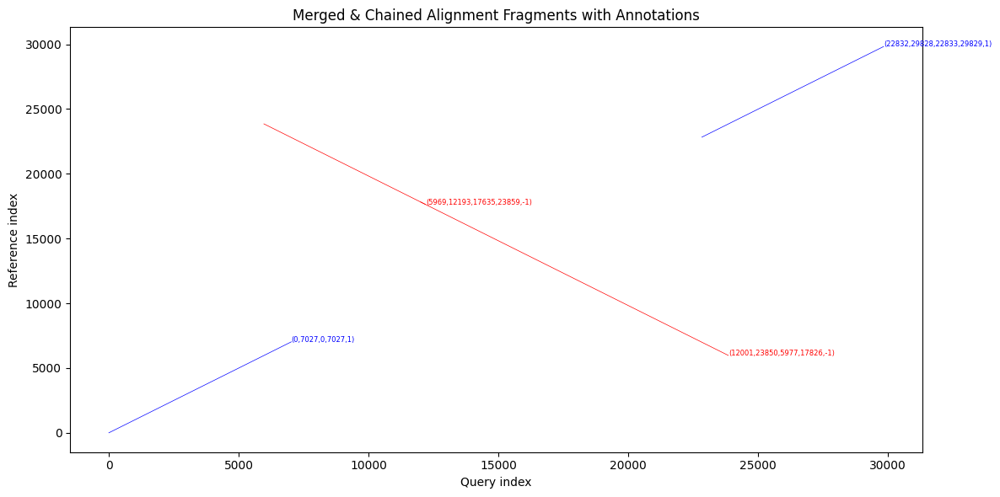

In [ ]:
from collections import defaultdict
def merge_aligned_fragments(fragments):
    groups = defaultdict(list)
    # 1) 按 strand 和 offset 分组
    for qs, qe, rs, re, sc, strand in fragments:
        offset = rs - qs if strand==1 else (rs + qe)  # 对逆向，这个 offset 使得 re + qs = const
        groups[(strand, offset)].append((qs, qe))

    merged = []
    # 2) 对每组里的 intervals 合并重叠或相接
    for (strand, offset), intervals in groups.items():
        intervals.sort()
        cur_s, cur_e = intervals[0]
        for s, e in intervals[1:]:
            if s <= cur_e + 1:         # 重叠或相接
                cur_e = max(cur_e, e)
            else:
                # 把上一段输出
                if strand==1:
                    rs, re = cur_s + offset, cur_e + offset
                else:
                    # 逆向：rs/re 距离 qs/ qe 保持反向关系
                    re = offset - cur_s
                    rs = offset - cur_e
                merged.append((cur_s, cur_e, rs, re, strand))
                cur_s, cur_e = s, e

        # 最后一段
        if strand==1:
            rs, re = cur_s + offset, cur_e + offset
        else:
            re = offset - cur_s
            rs = offset - cur_e
        merged.append((cur_s, cur_e, rs, re, strand))

    return merged


def filter_fragments4(fragments, ref, query,
                     min_len=30,
                     max_err=6):
    print("过滤片段")
    print("过滤前数量：" + str(len(fragments)))
    out = []
    cnt1=0
    cnt2=0
    for qs, qe, rs, re, strand in fragments:
        L = qe - qs + 1
        ed = calculate_distance(ref, query, rs, re, qs, qe)
        if L < min_len:
            cnt1+=1
            continue

        weight = L - ed
        out.append((qs, qe, rs, re, strand))
    print("过滤后数量：" + str(len(out)))
    print("after filter fragments:",out)
    print(f"过滤完成,由于 L < min_len 的数量：{cnt1}")
    return out




merged0 = merge_aligned_fragments(filtered3)

# merged = filter_fragments4(merged0, reference, query,
#                             min_len=1000, max_err=6)
merged = filter_fragments4(merged0, reference, query,
                            min_len=min_len4, max_err=6)




pre_ans = []
for qs, qe, rs, re, strand in merged:
    pre_ans.append((qs, qe, rs, re,strand))
    
print("len(pre_ans):"    , len(pre_ans))
# print(pre_ans)



print("合并后得到的区间：")
for qs, qe, rs, re, strand in merged:
    print(f"  query[{qs}:{qe}]  ↔  ref[{rs}:{re}]")

plt.figure(figsize=(12, 6))
for qs, qe, rs, re, strand in merged:
    if strand == 1:
        x_vals = [qs, qe]
        y_vals = [rs, re]
        color = 'b'
    else:
        x_vals = [qs, qe]
        y_vals = [re, rs]  # 反向时交换
        color = 'r'
    plt.plot(x_vals, y_vals, color=color, lw=0.5)
    # 在每条线的末端标注其元组
    label = f"({qs},{qe},{rs},{re},{strand})"
    plt.text(x_vals[1] + 5, y_vals[1] + 5, label, fontsize=6, color=color)

plt.xlabel("Query index")
plt.ylabel("Reference index")
plt.title("Merged & Chained Alignment Fragments with Annotations")
plt.tight_layout()
plt.show()


In [ ]:
tag=0
print("pre_ans:",pre_ans)
true_ans=[]





cnt=0
while(1):
    cnt+=1
    print(f"第{cnt}次循环：")
    
    choices=[]
    for qs, qe, rs, re ,strand in pre_ans:
        if tag>=qs and tag<qe:
            choices.append((qs,qe,rs,re,strand))
            # print("choices:",choices)
    print(f"此时rs<=tag<re的choices:{choices}")
    if(len(choices)>0):
        best=max(choices,key=lambda x:x[1]-tag)
        qs,qe,rs,re,strand=best
        
        if(cnt==1):
            true_ans.append(best)
            tag=qe
            print(f"此时best:{best},tag:{tag}")
            continue
            
        
        min_score=10000000
        print(f"qs:{qs},tag:{tag}")
        for div in range(qs,tag):
            #修改前一个，末尾
            qs11,qe11,rs11,re11,strand11=true_ans[-1]
            if strand11==1:
                qs1=qs11
                qe1=div
                rs1=rs11
                re1=rs1+qe1-qs1
            else:
                qs1=qs11
                qe1=div
                re1=re11
                rs1=qs1+re1-qe1
            qs22,qe22,rs22,re22,strand22=best
            if strand22==1:
                qs2=div
                qe2=qe22+1
                re2=re22+1
                rs2=re2+qs2-qe2
            else:
                qs2=div
                qe2=qe22+1
                rs2=rs22
                re2=rs2+qe2-qs2     
            score=calculate_distance(reference, query, rs1, re1, qs1, qe1)+calculate_distance(reference, query, rs2, re2, qs2, qe2)
            print(f"qs1:{qs1},qe1:{qe1},rs1:{rs1},re1:{re1}     ,qs2:{qs2},qe2:{qe2},rs2:{rs2},re2:{re2},    score:{score}")
            if score<min_score:
                min_score=score
                best_div=div
                print(f"此时best_div:{best_div},score:{score}")
        
        qs11,qe11,rs11,re11,strand11=true_ans[-1]
        del true_ans[-1]
        if strand11==1:
            qs1=qs11
            qe1=best_div
            rs1=rs11
            re1=rs1+qe1-qs1
        else:
            qs1=qs11
            qe1=best_div
            re1=re11
            rs1=qs1+re1-qe1
        qs22,qe22,rs22,re22,strand22=best
        if strand22==1:
            qs2=best_div
            qe2=qe22+1
            re2=re22+1
            rs2=re2+qs2-qe2
        else:
            qs2=best_div
            qe2=qe22+1
            rs2=rs22
            re2=rs2+qe2-qs2
        true_ans.append((qs1,qe1,rs1,re1,strand11))
        true_ans.append((qs2,qe2,rs2,re2,strand22))
        
        
        
        
        

        tag=qe2
        print(f"此时best:{best},tag:{tag}")
        
    else :
        print("此时没有rs<=tag<re的choices")
        for qs,qe,rs,re,strand in pre_ans:
            if qs>tag:
                choices.append((qs,qe,rs,re,strand))
        print(f"此时rs>tag的choices:{choices}")
        if(len(choices)>0):
            best=min(choices,key=lambda x:x[0])
            qs,qe,rs,re,strand=best
            if strand==1:
                qs1=tag
                qe1=qe+1
                re1=re+1
                rs1=re1+qs1-qe1
            else:
                qs1=tag
                qe1=qe+1
                rs1=rs
                re1=rs+qe-qs1+1

            true_ans.append((qs1,qe1,rs1,re1,strand))
            tag=qe1
            print(f"此时best:{best},tag:{tag}")
        else:
            break
    print(f"此时的true_ans:{true_ans}")
print("true_ans:",true_ans)


final_ans=[]

for qs,qe,rs,re,strand in true_ans:
    final_ans.append((qs,qe,rs,re))


pre_ans: [(22832, 29828, 22833, 29829, 1), (0, 7027, 0, 7027, 1), (5969, 12193, 17635, 23859, -1), (12001, 23850, 5977, 17826, -1)]
第1次循环：
此时rs<=tag<re的choices:[(0, 7027, 0, 7027, 1)]
此时best:(0, 7027, 0, 7027, 1),tag:7027
第2次循环：
此时rs<=tag<re的choices:[(5969, 12193, 17635, 23859, -1)]
qs:5969,tag:7027
qs1:0,qe1:5969,rs1:0,re1:5969     ,qs2:5969,qe2:12194,rs2:17635,re2:23860,    score:10
此时best_div:5969,score:10
qs1:0,qe1:5970,rs1:0,re1:5970     ,qs2:5970,qe2:12194,rs2:17635,re2:23859,    score:10
qs1:0,qe1:5971,rs1:0,re1:5971     ,qs2:5971,qe2:12194,rs2:17635,re2:23858,    score:10
qs1:0,qe1:5972,rs1:0,re1:5972     ,qs2:5972,qe2:12194,rs2:17635,re2:23857,    score:10
qs1:0,qe1:5973,rs1:0,re1:5973     ,qs2:5973,qe2:12194,rs2:17635,re2:23856,    score:10
qs1:0,qe1:5974,rs1:0,re1:5974     ,qs2:5974,qe2:12194,rs2:17635,re2:23855,    score:10
qs1:0,qe1:5975,rs1:0,re1:5975     ,qs2:5975,qe2:12194,rs2:17635,re2:23854,    score:10
qs1:0,qe1:5976,rs1:0,re1:5976     ,qs2:5976,qe2:12194,rs2:17635,r

In [ ]:
tuple_str=str(final_ans)
print(tuple_str)

calculate_value(tuple_str, reference, query)

[(0, 6097, 0, 6097), (6097, 12171, 17658, 23732), (12171, 23015, 6813, 17657), (23015, 29829, 23016, 29830)]
16
[[0, 6097, 0, 6097], [6097, 12171, 17658, 23732], [12171, 23015, 6813, 17657], [23015, 29829, 23016, 29830]]
query_st:0, query_en:6097, ref_st:0, ref_en:6097:cal_dis:2, aligned:6097
query_st:6097, query_en:12171, ref_st:17658, ref_en:23732:cal_dis:3, aligned:6074
query_st:12171, query_en:23015, ref_st:6813, ref_en:17657:cal_dis:2, aligned:10844
query_st:23015, query_en:29829, ref_st:23016, ref_en:29830:cal_dis:1, aligned:6814
editdistance:8, aligned:29829


29821